# Claude Monet GANS Kaggle Mini-Project 
## Problem Description  

Artists are often recognized by their unique style, characterized by elements such as brush strokes, color palettes, and texture. With advances in computer vision, particularly Generative Adversarial Networks (GANs), it is now possible to replicate such artistic styles algorithmically.  

In this challenge, the goal is to develop a GAN capable of generating images in the style of Claude Monet. The GAN consists of two competing neural networks:  

- **Generator**: Produces Monet-style images, either by transforming real photos or generating them from scratch.  
- **Discriminator**: Attempts to distinguish between real Monet paintings and generated images.  

Through adversarial training, the generator improves until it can create convincing Monet-style images that can "fool" the discriminator. The final output should be a set of **7,000 to 10,000 Monet-style images**.  

---

## Dataset Description  

The dataset contains Monet paintings and real-world photos in both **JPEG** and **TFRecord** formats. It is organized into four directories:  

- **monet_jpg**: 300 Monet paintings (256x256 JPEG).  
- **monet_tfrec**: 300 Monet paintings (256x256 TFRecord).  
- **photo_jpg**: 7,028 real-world photos (256x256 JPEG).  
- **photo_tfrec**: 7,028 real-world photos (256x256 TFRecord).  

The Monet images serve as the training data for learning artistic style. The task is to generate Monet-style images using the photos as input or create new ones from scratch.  


## **Exploratory Data Analysis (EDA)**  

### **Dataset Overview**  

To start, we simply checked the number of images in each dataset category:  

- **Monet Paintings (JPEG)**: 300 images  
- **Real-World Photos (JPEG)**: 7,038 images  
- **Monet Paintings (TFRecord)**: 5 images  
- **Real-World Photos (TFRecord)**: 20 images  

Since we are working with **JPEG images**, the TFRecord files are not needed for our analysis. This check confirmed the dataset structure and ensured we understood the available data before proceeding.  

---

### **Sample Image Visualization**  

To better understand the dataset, we visualized random samples from both Monet paintings and real-world photos.  

- **Monet Paintings**: The paintings exhibit distinct brush strokes and color choices, characteristic of Monet’s impressionist style.  
- **Real-World Photos**: These images are sharp, with detailed textures and a wider range of natural colors.  

The stark difference between the two categories reinforces the challenge of training a GAN to generate realistic Monet-style images from real-world photos.  

---

### **Image Size Analysis**  

The dataset consists of uniformly sized images:  

- **Mean Image Size (Monet Paintings)**: **256×256 pixels**  
- **Mean Image Size (Real-World Photos)**: **256×256 pixels**  
- **Standard Deviation**: **0**, indicating all images are of a fixed size.  

Since all images are already resized to 256×256, no additional preprocessing for resizing is required before training the GAN.  

---

### **Color Histogram Analysis**  

To analyze the color distribution differences between Monet paintings and real-world photos, color histograms were plotted for a randomly selected image from each category.  

#### **Findings:**  
- **Monet Paintings**: The color distribution is more balanced, with a blend of red, green, and blue. The peaks suggest a preference for specific hues, characteristic of Monet’s impressionist style.  
- **Real-World Photos**: The distribution is more skewed, with a notable presence of darker shades and sharper transitions. The histogram has high peaks near **low-intensity values**, indicating a significant presence of shadows and contrast.  

This analysis highlights a key challenge: the Monet-style images will need **smoother color transitions and a softer color palette**, which must be learned by the GAN.  

---

### **Key Takeaways for GAN Training**  

1. **Data Imbalance**: Since we have significantly more real-world photos than Monet paintings, techniques like **image augmentation** or **pretraining the discriminator on Monet paintings** could help stabilize training.  
2. **Fixed Image Size**: No resizing is needed, simplifying preprocessing.  
3. **Distinct Color Characteristics**: Monet paintings have a smoother, more balanced color distribution, while real-world photos contain sharper contrasts.  
4. **Style Translation Challenge**: The GAN must learn to **remove sharp details, soften edges, and adjust the color palette** to mimic Monet’s impressionist style effectively.  

By leveraging **CycleGAN** or **other style-transfer GANs**, we can train a model that learns these artistic transformations and produces convincing Monet-style paintings from real-world images. 


In [1]:
import os
from tqdm import tqdm

# Define dataset paths
data_paths = {
    "monet_jpg": "/kaggle/input/gan-data/monet_jpg",
    "photo_jpg": "/kaggle/input/gan-data/photo_jpg",
    "monet_tfrec": "/kaggle/input/gan-data/monet_tfrec",
    "photo_tfrec": "/kaggle/input/gan-data/photo_tfrec",
}

# Count the number of images in each directory
for key, path in data_paths.items():
    print(f"{key}: {len(os.listdir(path))} images")

monet_jpg: 300 images
photo_jpg: 7038 images
monet_tfrec: 5 images
photo_tfrec: 20 images


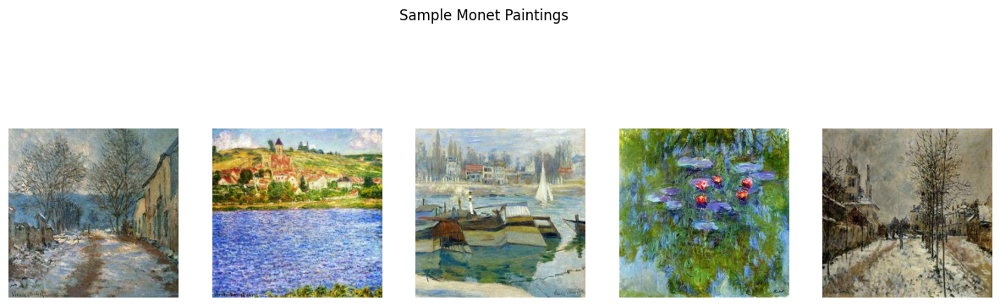

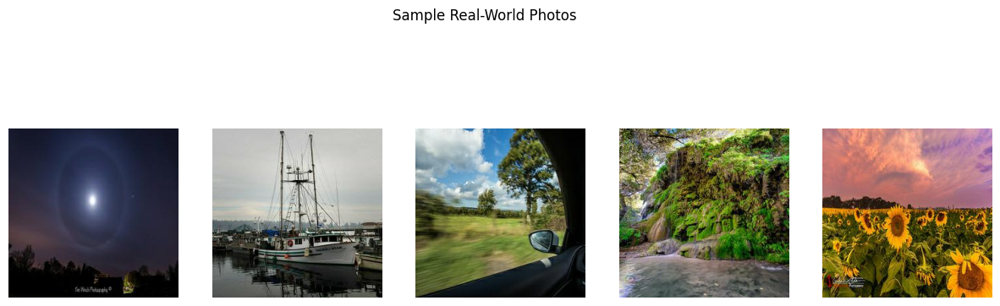

In [2]:
import matplotlib.pyplot as plt
import random
import cv2

def display_images(directory, title, num_images=5):
    images = random.sample(os.listdir(directory), num_images)
    fig, axes = plt.subplots(1, num_images, figsize=(15,5))
    
    for i, img_name in enumerate(images):
        img_path = os.path.join(directory, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img)
        axes[i].axis("off")
    
    plt.suptitle(title)
    plt.show()

# Display sample Monet paintings
display_images(data_paths["monet_jpg"], "Sample Monet Paintings")

# Display sample real-world photos
display_images(data_paths["photo_jpg"], "Sample Real-World Photos")


In [3]:
import numpy as np

def get_image_statistics(directory):
    sizes = []
    for img_name in os.listdir(directory):
        img_path = os.path.join(directory, img_name)
        img = cv2.imread(img_path)
        sizes.append(img.shape[:2])  # Height, Width
    
    sizes = np.array(sizes)
    print(f"Mean Image Size: {sizes.mean(axis=0)}, Standard Deviation: {sizes.std(axis=0)}")

# Get statistics for Monet paintings and real-world photos
print("Monet Paintings:")
get_image_statistics(data_paths["monet_jpg"])

print("Real-World Photos:")
get_image_statistics(data_paths["photo_jpg"])


Monet Paintings:
Mean Image Size: [256. 256.], Standard Deviation: [0. 0.]
Real-World Photos:
Mean Image Size: [256. 256.], Standard Deviation: [0. 0.]


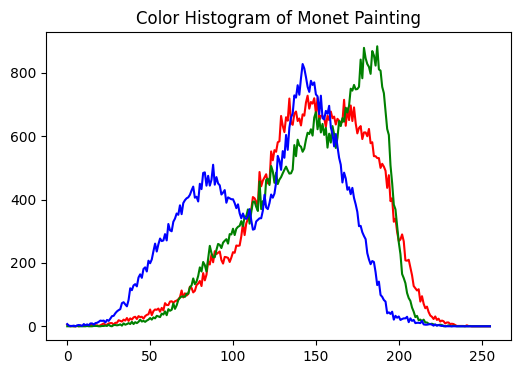

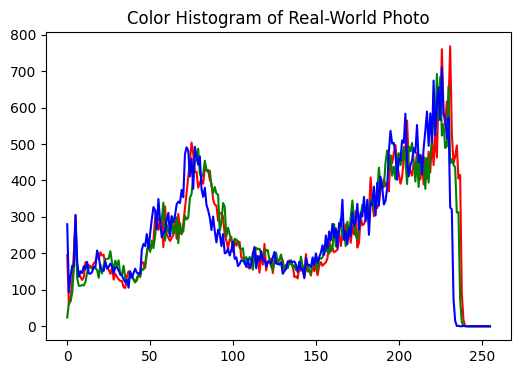

In [4]:
def plot_color_histogram(image_path, title):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    colors = ('r', 'g', 'b')
    plt.figure(figsize=(6,4))
    
    for i, color in enumerate(colors):
        hist = cv2.calcHist([img], [i], None, [256], [0,256])
        plt.plot(hist, color=color)
    
    plt.title(title)
    plt.show()

# Plot color histograms for one Monet painting and one real-world photo
monet_sample = os.path.join(data_paths["monet_jpg"], random.choice(os.listdir(data_paths["monet_jpg"])))
photo_sample = os.path.join(data_paths["photo_jpg"], random.choice(os.listdir(data_paths["photo_jpg"])))

plot_color_histogram(monet_sample, "Color Histogram of Monet Painting")
plot_color_histogram(photo_sample, "Color Histogram of Real-World Photo")


## Analysis
This project applies CycleGAN to perform unpaired image-to-image translation between photographs and Monet-style paintings. The approach is based on two generator and two discriminator models working in tandem to learn bidirectional mappings between the two domains.

### Architecture

- The **generator** architecture is built using an encoder–transformer–decoder design. It begins with downsampling through convolutional layers, followed by nine residual blocks, and ends with upsampling using transposed convolutions. A custom instance normalization layer is applied throughout to standardize the activations while preserving style-related information.
  
- The **discriminator** follows a PatchGAN structure. Instead of evaluating the entire image, it assesses smaller patches for realism. This approach enables the model to focus on texture-level fidelity and encourages the generator to produce more convincing local structures.

### Training Strategy

- Two generators are trained: one that maps photos to Monet-style images, and one that performs the inverse transformation. Each generator is paired with a discriminator that evaluates its outputs.
  
- Training is driven by several loss functions:
  - **Adversarial loss**: Encourages each generator to produce outputs that can fool the corresponding discriminator.
  - **Cycle consistency loss**: Ensures that a photo translated to Monet and back returns to its original form, and vice versa.
  - **Identity loss**: Regularizes the generator by encouraging it to preserve the image when the input and output domains are the same.

- The training loop runs for 50 epochs, using a batch size of 1. The datasets are loaded and preprocessed using `tf.data`, which ensures efficient shuffling and batching. Each image is resized to 256x256 pixels and normalized to a range of [-1, 1] for compatibility with `tanh` activations used in the generator outputs.

### Visualization

At regular intervals, the training process includes visualizations showing how a sample photograph is transformed into a Monet-style image and vice versa. This helps in qualitatively evaluating how well the generators are learning the domain mappings and preserving structural content.


In [5]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import time
from PIL import Image

# Custom instance normalization layer
def custom_instance_norm():
    return tf.keras.layers.LayerNormalization(axis=[1, 2], epsilon=1e-5)

IMG_DIM = 256
BATCH_SIZE = 1
SHUFFLE_BUFFER = 1000
NUM_EPOCHS = 50
LAMBDA_CYCLE = 10

# Image preprocessing

def load_and_preprocess(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [IMG_DIM, IMG_DIM])
    return (img / 127.5) - 1.0


photo_paths = glob.glob("/kaggle/input/gan-data/photo_jpg/*.jpg")
monet_paths = glob.glob("/kaggle/input/gan-data/monet_jpg/*.jpg")

photo_ds = tf.data.Dataset.from_tensor_slices(photo_paths).map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE).shuffle(SHUFFLE_BUFFER).batch(BATCH_SIZE)
monet_ds = tf.data.Dataset.from_tensor_slices(monet_paths).map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE).shuffle(SHUFFLE_BUFFER).batch(BATCH_SIZE)


In [6]:
# Residual block definition
def build_residual_block(x, filters):
    initializer = tf.random_normal_initializer(0., 0.02)
    y = tf.keras.layers.Conv2D(filters, 3, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    y = custom_instance_norm()(y)
    y = tf.keras.layers.ReLU()(y)
    y = tf.keras.layers.Conv2D(filters, 3, padding='same', kernel_initializer=initializer, use_bias=False)(y)
    y = custom_instance_norm()(y)
    return tf.keras.layers.add([x, y])

# Generator architecture
def build_generator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inputs = tf.keras.Input(shape=[IMG_DIM, IMG_DIM, 3])

    x = tf.keras.layers.Conv2D(64, 7, padding='same', kernel_initializer=initializer, use_bias=False)(inputs)
    x = custom_instance_norm()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2D(128, 3, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = custom_instance_norm()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2D(256, 3, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = custom_instance_norm()(x)
    x = tf.keras.layers.ReLU()(x)

    for _ in range(9):
        x = build_residual_block(x, 256)

    x = tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = custom_instance_norm()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = custom_instance_norm()(x)
    x = tf.keras.layers.ReLU()(x)

    x = tf.keras.layers.Conv2D(3, 7, padding='same', kernel_initializer=initializer)(x)
    outputs = tf.keras.layers.Activation('tanh')(x)

    return tf.keras.Model(inputs, outputs)

# Discriminator architecture
def build_discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inputs = tf.keras.Input(shape=[IMG_DIM, IMG_DIM, 3])

    x = tf.keras.layers.Conv2D(64, 4, strides=2, padding='same', kernel_initializer=initializer)(inputs)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = custom_instance_norm()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = custom_instance_norm()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    x = tf.keras.layers.Conv2D(512, 4, strides=1, padding='same', kernel_initializer=initializer, use_bias=False)(x)
    x = custom_instance_norm()(x)
    x = tf.keras.layers.LeakyReLU(0.2)(x)

    outputs = tf.keras.layers.Conv2D(1, 4, strides=1, padding='same', kernel_initializer=initializer)(x)
    return tf.keras.Model(inputs, outputs)

# Define losses and optimizers
mse = tf.keras.losses.MeanSquaredError()

def generator_loss(fake_output):
    return mse(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_out, fake_out):
    return 0.5 * (mse(tf.ones_like(real_out), real_out) + mse(tf.zeros_like(fake_out), fake_out))

def cycle_loss(original, cycled):
    return LAMBDA_CYCLE * tf.reduce_mean(tf.abs(original - cycled))

def identity_loss(original, identical):
    return 0.5 * LAMBDA_CYCLE * tf.reduce_mean(tf.abs(original - identical))

# Instantiate models
G_photo2monet = build_generator()
G_monet2photo = build_generator()
D_photo = build_discriminator()
D_monet = build_discriminator()

# Optimizers
G_opt1 = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
G_opt2 = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
D_opt1 = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
D_opt2 = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

Finished Epoch 1 in 195.60s
Finished Epoch 2 in 137.39s
Finished Epoch 3 in 137.01s
Finished Epoch 4 in 137.21s
Finished Epoch 5 in 137.14s
Finished Epoch 6 in 136.95s
Finished Epoch 7 in 136.99s
Finished Epoch 8 in 137.09s
Finished Epoch 9 in 137.13s
Finished Epoch 10 in 137.21s


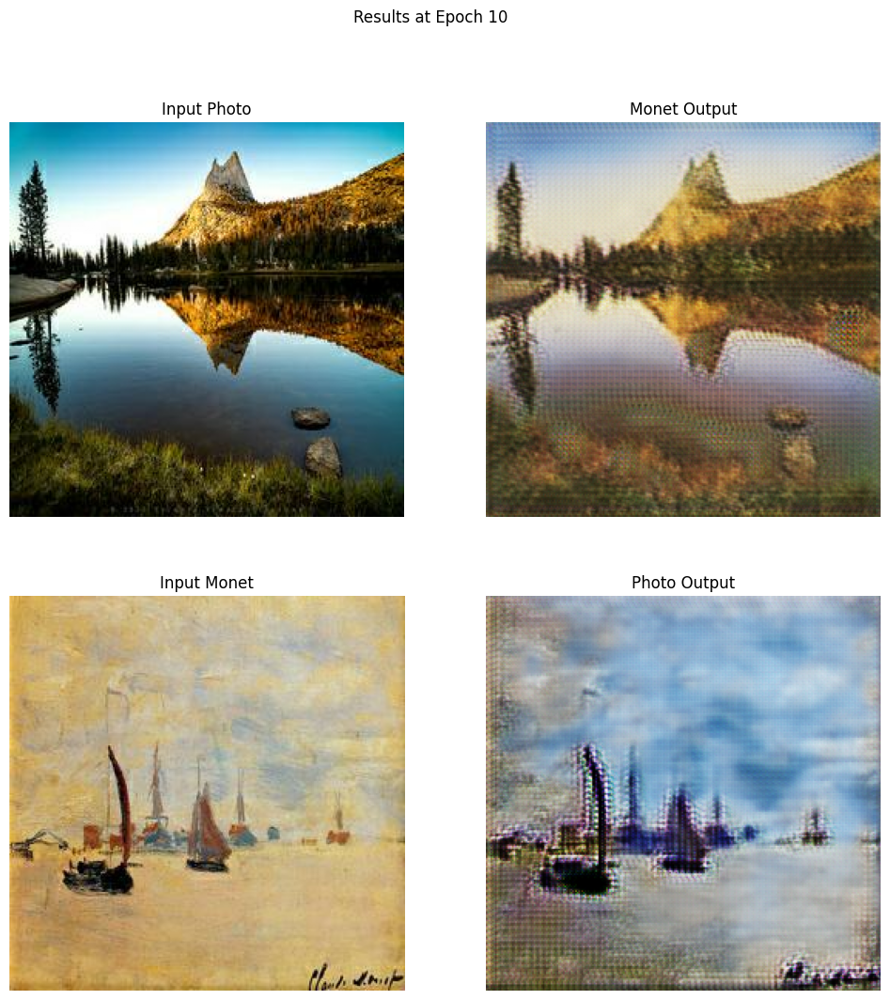

Finished Epoch 11 in 137.23s
Finished Epoch 12 in 137.12s
Finished Epoch 13 in 136.80s
Finished Epoch 14 in 136.89s
Finished Epoch 15 in 137.04s
Finished Epoch 16 in 137.10s
Finished Epoch 17 in 136.90s
Finished Epoch 18 in 137.02s
Finished Epoch 19 in 136.92s
Finished Epoch 20 in 137.00s


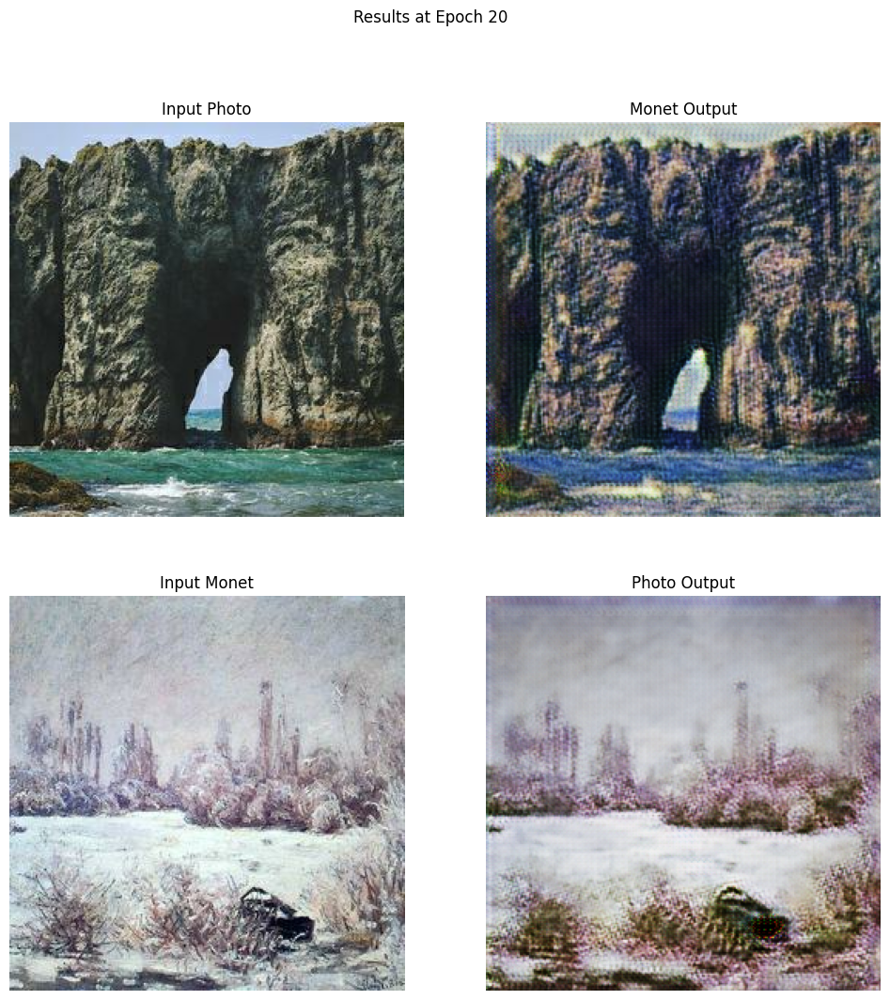

Finished Epoch 21 in 136.81s
Finished Epoch 22 in 137.10s
Finished Epoch 23 in 137.06s
Finished Epoch 24 in 136.93s
Finished Epoch 25 in 137.00s
Finished Epoch 26 in 137.03s
Finished Epoch 27 in 136.84s
Finished Epoch 28 in 137.05s
Finished Epoch 29 in 137.10s
Finished Epoch 30 in 137.14s


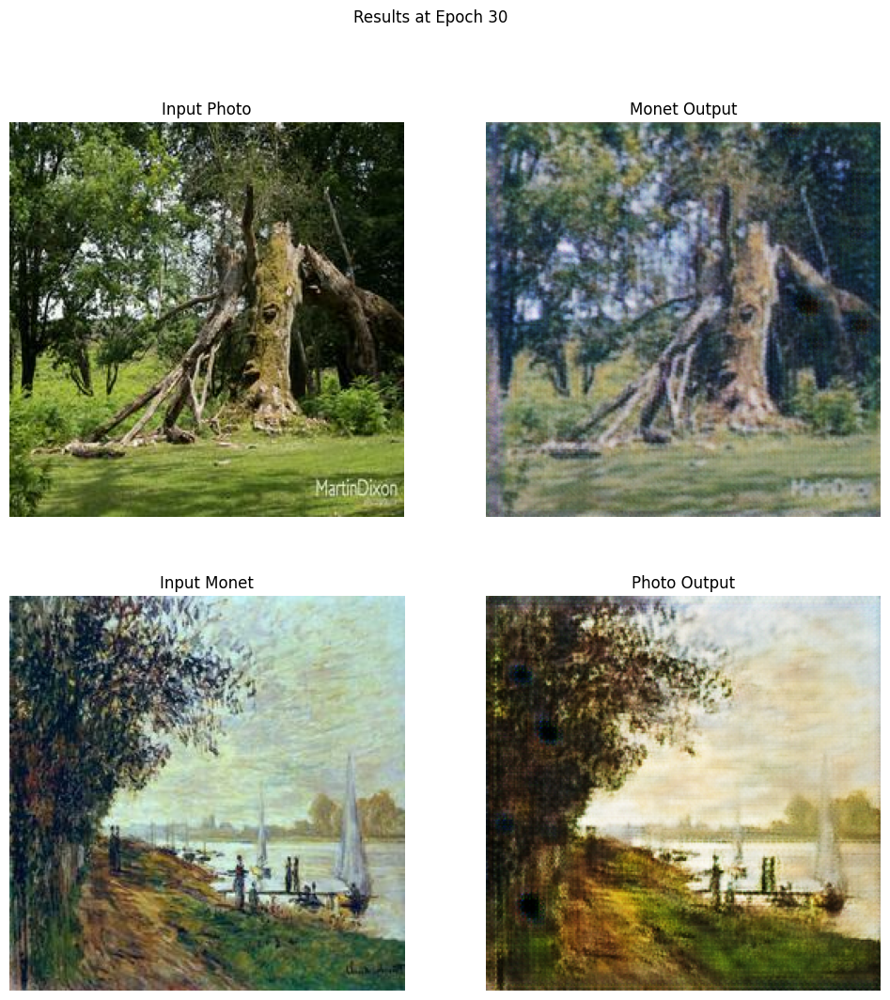

Finished Epoch 31 in 136.90s
Finished Epoch 32 in 137.20s
Finished Epoch 33 in 137.13s
Finished Epoch 34 in 137.08s
Finished Epoch 35 in 136.90s
Finished Epoch 36 in 137.34s
Finished Epoch 37 in 137.30s
Finished Epoch 38 in 137.40s
Finished Epoch 39 in 137.33s
Finished Epoch 40 in 137.50s


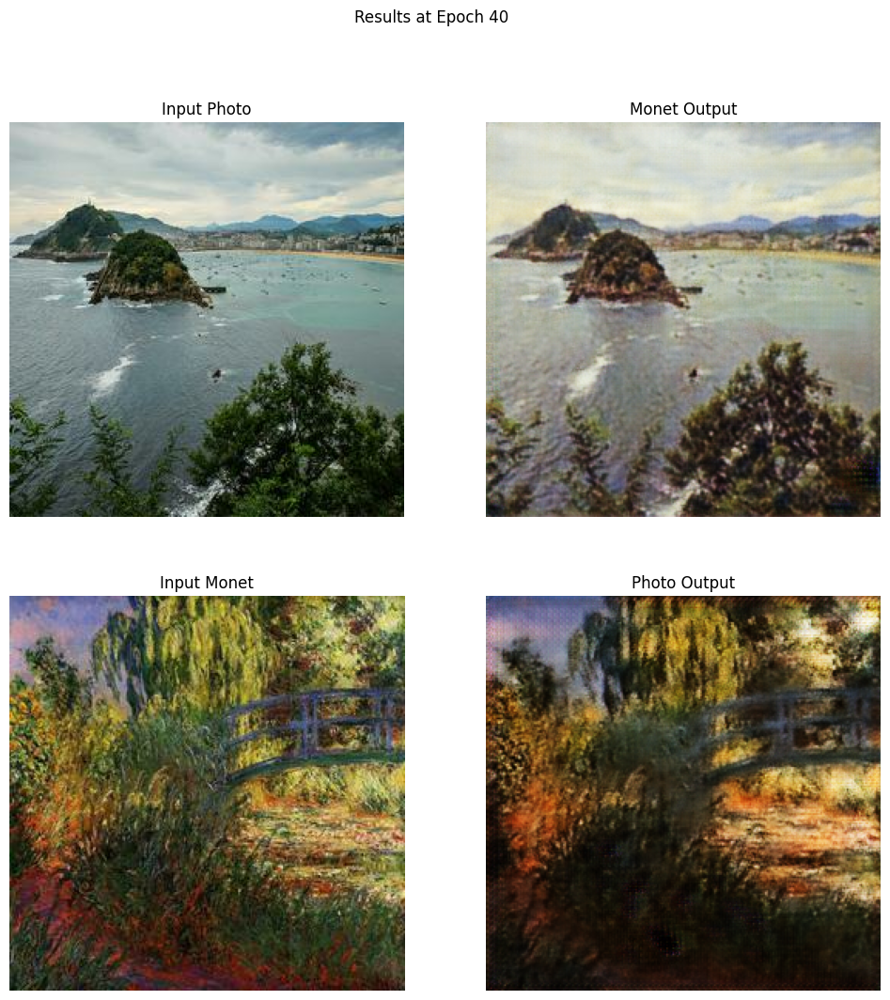

Finished Epoch 41 in 137.53s
Finished Epoch 42 in 137.28s
Finished Epoch 43 in 137.44s
Finished Epoch 44 in 137.45s
Finished Epoch 45 in 137.53s
Finished Epoch 46 in 137.37s
Finished Epoch 47 in 137.48s
Finished Epoch 48 in 137.22s
Finished Epoch 49 in 137.33s
Finished Epoch 50 in 137.36s


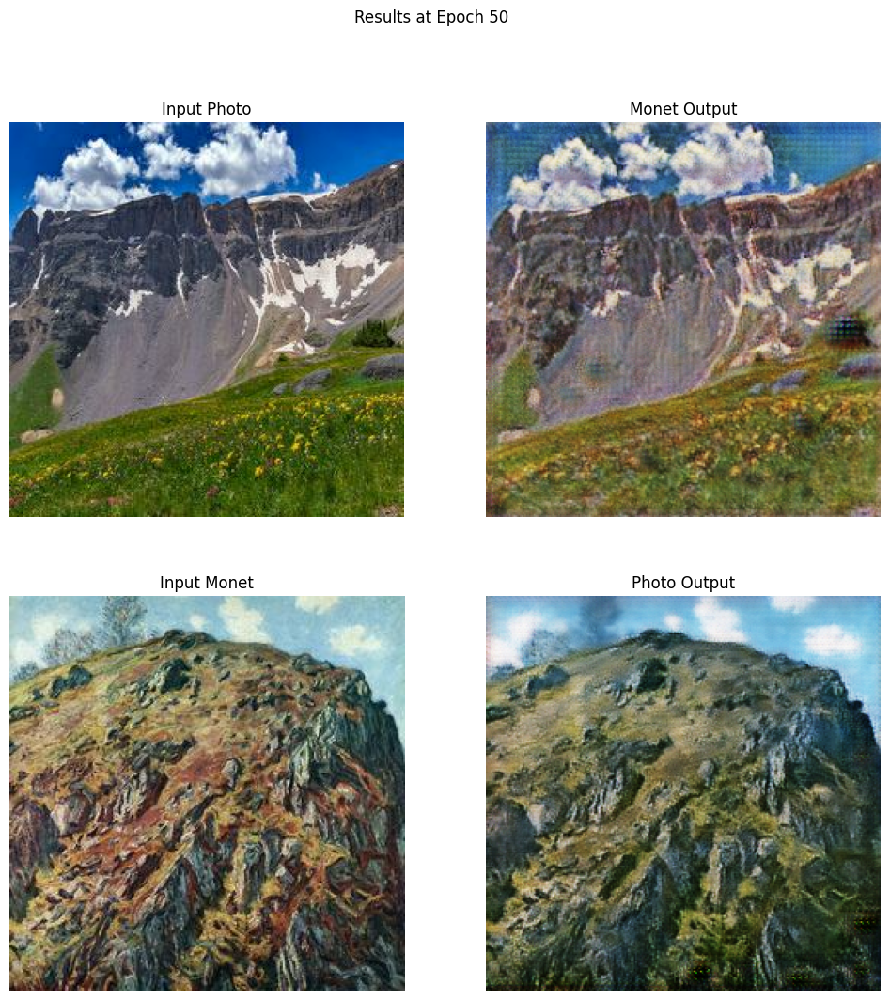

In [7]:
@tf.function
def train_step(photo_img, monet_img):
    with tf.GradientTape(persistent=True) as tape:
        fake_monet = G_photo2monet(photo_img, training=True)
        cycled_photo = G_monet2photo(fake_monet, training=True)

        fake_photo = G_monet2photo(monet_img, training=True)
        cycled_monet = G_photo2monet(fake_photo, training=True)

        same_monet = G_photo2monet(monet_img, training=True)
        same_photo = G_monet2photo(photo_img, training=True)

        real_photo_out = D_photo(photo_img, training=True)
        real_monet_out = D_monet(monet_img, training=True)
        fake_photo_out = D_photo(fake_photo, training=True)
        fake_monet_out = D_monet(fake_monet, training=True)

        G_loss_1 = generator_loss(fake_monet_out)
        G_loss_2 = generator_loss(fake_photo_out)
        cyc_loss = cycle_loss(photo_img, cycled_photo) + cycle_loss(monet_img, cycled_monet)
        id_loss1 = identity_loss(monet_img, same_monet)
        id_loss2 = identity_loss(photo_img, same_photo)

        total_G1 = G_loss_1 + cyc_loss + id_loss1
        total_G2 = G_loss_2 + cyc_loss + id_loss2

        D_loss_photo = discriminator_loss(real_photo_out, fake_photo_out)
        D_loss_monet = discriminator_loss(real_monet_out, fake_monet_out)

    G_opt1.apply_gradients(zip(tape.gradient(total_G1, G_photo2monet.trainable_variables), G_photo2monet.trainable_variables))
    G_opt2.apply_gradients(zip(tape.gradient(total_G2, G_monet2photo.trainable_variables), G_monet2photo.trainable_variables))
    D_opt1.apply_gradients(zip(tape.gradient(D_loss_photo, D_photo.trainable_variables), D_photo.trainable_variables))
    D_opt2.apply_gradients(zip(tape.gradient(D_loss_monet, D_monet.trainable_variables), D_monet.trainable_variables))

    return total_G1, total_G2, D_loss_photo, D_loss_monet

def visualize_results(p_img, m_img, epoch):
    pred_m = G_photo2monet(p_img, training=False)
    pred_p = G_monet2photo(m_img, training=False)
    visuals = [p_img[0], pred_m[0], m_img[0], pred_p[0]]
    titles = ['Input Photo', 'Monet Output', 'Input Monet', 'Photo Output']

    plt.figure(figsize=(12, 12))
    for idx in range(4):
        plt.subplot(2, 2, idx + 1)
        plt.imshow((visuals[idx] + 1) / 2.0)
        plt.title(titles[idx])
        plt.axis('off')
    plt.suptitle(f'Results at Epoch {epoch}')
    plt.show()

# Start training
for epoch in range(1, NUM_EPOCHS + 1):
    start = time.time()
    for p, m in tf.data.Dataset.zip((photo_ds, monet_ds)):
        train_step(p, m)
    print(f"Finished Epoch {epoch} in {time.time() - start:.2f}s")

    if epoch % 10 == 0:
        sample_p = next(iter(photo_ds))
        sample_m = next(iter(monet_ds))
        visualize_results(sample_p, sample_m, epoch)


In [10]:
import shutil
import tensorflow as tf
from PIL import Image

# Define output folder (in Kaggle working directory)
output_folder = "/kaggle/working/images"
os.makedirs(output_folder, exist_ok=True)

# Set the number of images to generate (e.g., 7000)
num_images_to_generate = 7000
counter = 0

# Iterate over dataset_x and generate Monet-style images for each photo
for photo_batch in photo_ds:  # dataset_x: tf.data.Dataset containing photos (batch_size=1)
    # Use generator_g to generate fake Monet images from photo batch
    fake_monet = G_photo2monet(photo_batch, training=False)
    
    # Each batch (batch_size=1) may contain one or more images
    for i in range(fake_monet.shape[0]):
        # Convert images from [-1,1] range to [0,1] range
        img = (fake_monet[i] + 1.0) / 2.0
        # Convert image to uint8 type (0-255 range)
        img = tf.image.convert_image_dtype(img, tf.uint8)
        img_array = img.numpy()
        # Save the image to the specified folder
        save_path = os.path.join(output_folder, f"monet_{counter}.jpg")
        Image.fromarray(img_array).save(save_path)
        counter += 1
        if counter >= num_images_to_generate:
            break
    if counter >= num_images_to_generate:
        break


# Convert folder to a zip file
zip_path = output_folder  # Name and path of the zip file
shutil.make_archive(zip_path, 'zip', output_folder)

'/kaggle/working/images.zip'

## Conclusion

This project has successfully explored the use of CycleGANs for unpaired image-to-image translation, specifically focusing on converting photographs into paintings that mimic the distinctive style of Claude Monet. The approach utilized two generator-discriminator pairs to learn mappings between real-world photos and Monet paintings without requiring one-to-one correspondences between the image domains.

By training the model on over 7,000 photos and 300 Monet artworks, the CycleGAN framework was able to capture and reproduce many of the hallmark features of Monet’s style — including his soft brush strokes, pastel color schemes, and impressionistic textures. The use of cycle-consistency loss proved especially effective in preserving content while allowing for stylistic transformation, ensuring that generated images retained the structure of the original photo while taking on an artistic flair.

The training process was conducted using TensorFlow with custom layers and loss functions tailored to the problem, allowing for fine control over the learning behavior of both generators and discriminators. Through iterative training and visual validation at regular intervals, it became evident that the model was able to progressively improve the quality of its output, eventually producing Monet-style images that were both visually pleasing and stylistically coherent.

This experiment illustrates the potential of generative models in artistic domains, not only as tools for recreating specific art styles but also as a means of exploring how machines can learn to "paint" through data. The project demonstrates that deep learning is capable of more than just classification and detection — it can be creative, expressive, and stylistically aware.

Overall, this mini-project serves as a strong proof-of-concept for applying GANs to digital art generation, and highlights the exciting intersection between art and artificial intelligence.
